In [1]:
import os

## Set directory
os.chdir('/hpc/group/pbenfeylab/CheWei/CW_data/genesys')

import networkx as nx
from genesys_evaluate_v1 import *
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
# Suppress all warning messages
warnings.filterwarnings("ignore", category=DeprecationWarning)

/hpc/group/pbenfeylab/ch416/miniconda3/envs/genesys/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
## Conda Env pytorch-gpu on DCC
print(torch.__version__)
print(sc.__version__) 

1.11.0
1.9.6


In [3]:
## Genes considered/used (shared among samples) 
gene_list = pd.read_csv('./gene_list_1108.csv')

## Load Data

In [4]:
with open("./genesys_root_data.pkl", 'rb') as file_handle:
    data = pickle.load(file_handle)
    
batch_size = 2000
dataset = Root_Dataset(data['X_test'], data['y_test'])
loader = DataLoader(dataset,
                         batch_size = batch_size,
                         shuffle = True, drop_last=True)

In [5]:
input_size = data['X_train'].shape[1]
## 10 cell types 
output_size = 10
embedding_dim = 256
hidden_dim = 256
n_layers = 2
device = "cpu"
path = "./"

## Load trained GeneSys model

In [6]:
model = ClassifierLSTM(input_size, output_size, embedding_dim, hidden_dim, n_layers).to(device)
model.load_state_dict(torch.load(path+"/workstation/genesys_model_trained_on_root_atlas_20240308_continue4.pth", map_location=torch.device('cpu')))
model = model
model.eval()

ClassifierLSTM(
  (fc1): Sequential(
    (0): Linear(in_features=17513, out_features=256, bias=True)
    (1): Dropout(p=0.2, inplace=False)
    (2): GaussianNoise()
  )
  (fc): Sequential(
    (0): ReLU()
    (1): Linear(in_features=512, out_features=512, bias=True)
    (2): ReLU()
    (3): Linear(in_features=512, out_features=10, bias=True)
  )
  (lstm): LSTM(256, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (b_to_z): DBlock(
    (fc1): Linear(in_features=512, out_features=256, bias=True)
    (fc2): Linear(in_features=512, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc_logsigma): Linear(in_features=256, out_features=512, bias=True)
  )
  (bz2_infer_z1): DBlock(
    (fc1): Linear(in_features=1024, out_features=256, bias=True)
    (fc2): Linear(in_features=1024, out_features=256, bias=True)
    (fc_mu): Linear(in_features=256, out_features=512, bias=True)
    (fc

In [7]:
classes = ['Columella', 'Lateral Root Cap', 'Phloem', 'Xylem', 'Procambium', 'Pericycle', 'Endodermis', 'Cortex', 'Atrichoblast', 'Trichoblast']
class2num = {c: i for (i, c) in enumerate(classes)}
num2class = {i: c for (i, c) in enumerate(classes)}

In [8]:
cts = ['Atrichoblast','Trichoblast','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Lateral Root Cap','Columella']
ctw = np.zeros((len(cts), 17513, 17513))
## number of cells sampled from the atlas
batch_size = 2000

In [9]:
## GRN for the transition t7 to t9
for ct in cts:
    print(ct)
    cws = np.zeros((len(loader), 17513, 17513))
    with torch.no_grad():
        for i, sample in enumerate(loader):
            x = sample['x'].to(device)
            y = sample['y'].to(device)
            y_label = [num2class[i] for i in y.tolist()]
            
            pred_h = model.init_hidden(batch_size)
            tfrom = model.generate_next(x, pred_h, 6).to('cpu').detach().numpy()
            cfrom = tfrom[np.where(np.array(y_label)==ct)[0],:]
            
            pred_h = model.init_hidden(batch_size)
            tto = model.generate_next(x, pred_h, 8).to('cpu').detach().numpy()   
            cto = tto[np.where(np.array(y_label)==ct)[0],:]
            
            cw = torch.linalg.lstsq(torch.tensor(cfrom), torch.tensor(cto)).solution.detach().numpy()
            cws[i] = cw
    
    ## Calculate mean across number of repeats
    cwm = np.mean(cws, axis=0)
    ctw[cts.index(ct)] = cwm

Atrichoblast
Trichoblast
Cortex
Endodermis
Pericycle
Procambium
Xylem
Phloem
Lateral Root Cap
Columella


In [10]:
# Save the array to disk
np.save('genesys_ctw_t7-t9.npy', ctw)

In [11]:
ctw = np.load('genesys_ctw_t7-t9.npy')

In [12]:
## Calculate z-scores
ctw_z = np.zeros((len(cts), 17513, 17513))
for i in range(len(cts)):
    ctw_z[i] = (ctw[i] - np.mean(ctw[i])) / np.std(ctw[i])

In [13]:
## Filtering based on z-scores (with no weights)
ctw_f = np.zeros((len(cts), 17513, 17513))
## z-score threshold (keep values > mean + threshold*std)
threshold=3
for i in range(len(cts)):
    ctw_f[i] = np.abs(ctw_z[i]) > threshold

## Load TFs list

In [14]:
wanted_TFs = pd.read_csv("./Kay_TF_thalemine_annotations.csv")

In [15]:
## Make TF names unique and assign preferred names
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G33880"]="WOX9"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G45160"]="SCL27"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G04410"]="NAC78"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G29035"]="ORS1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02540"]="ZHD3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G16500"]="IAA26"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G09740"]="HAG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G24660"]="ZHD2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G46880"]="HDG5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G28420"]="RLT1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G14580"]="BLJ"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G45260"]="BIB"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G02070"]="RVN"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G28160"]="FIT"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G68360"]="GIS3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G20640"]="NLP4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G05550"]="VFP5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G59470"]="FRF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G15150"]="HAT7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G14750"]="WER"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G75710"]="BRON"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G74500"]="TMO7"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT2G12646"]="RITF1"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT3G48100"]="ARR5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G16141"]="GATA17L"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G65640"]="NFL"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G62700"]="VND5"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT4G36160"]="VND2"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G66300"]="VND3"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT1G12260"]="VND4"
wanted_TFs['Name'][wanted_TFs['GeneID']=="AT5G62380"]="VND6"

In [16]:
pd.Series(wanted_TFs['Name']).value_counts().head(5)

Name
NAC001    1
PRE5      1
MYB118    1
MYB21     1
MYB0      1
Name: count, dtype: int64

## Network analysis

In [17]:
TFidx = []
for i in wanted_TFs['GeneID']:
    if i in gene_list['features'].tolist():
        TFidx.append(np.where(gene_list['features']==i)[0][0])

TFidx = np.sort(np.array(TFidx))

In [18]:

def network(i):
    ## No weights
    adj_nw = ctw_f[i]
    ## Weighted
    adj = ctw[i]*ctw_f[i]
    ## TF only
    adj = adj[np.ix_(TFidx,TFidx)]
    adj_nw = adj_nw[np.ix_(TFidx,TFidx)]
    
    ## Remove no connect 
    regidx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[0]).value_counts().index[pd.Series(np.where(adj_nw==True)[0]).value_counts()>=1]))
    taridx = np.sort(np.array(pd.Series(np.where(adj_nw==True)[1]).value_counts().index[pd.Series(np.where(adj_nw==True)[1]).value_counts()>=1]))
    ## Reciprocol
    keepidx = np.sort(np.array(list(set(regidx).intersection(taridx))))
    #keepidx = np.sort(np.array(list(set(regidx).union(taridx))))
    
    TFID = np.array(gene_list['features'][TFidx])[keepidx].tolist()
    ## TF name to keep
    TFname = []
    for i in np.array(gene_list['features'][TFidx])[keepidx]:
        TFname.append(wanted_TFs['Name'][np.where(wanted_TFs['GeneID']==i)[0][0]])
        
    adj = adj[np.ix_(keepidx,keepidx)]
    
    # Create a NetworkX graph for non-directed edges
    G = nx.Graph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=abs(weight), distance=1/abs(weight))
            

    ## Measures the extent to which how close a node is to all other nodes in the network, considering the shortest paths or geodesic distances between nodes
    closeness_centrality = nx.closeness_centrality(G, distance='distance')
    ## Measures the extent to which a node that are not only well-connected but also connected to other well-connected nodes.
    eigenvector_centrality = nx.eigenvector_centrality(G)
    
    # Create a NetworkX graph for diected edges
    G = nx.MultiDiGraph()  # supports directed edges and allows for multiple edges between the same pair of nodes
    
    # Add nodes to the graph
    num_nodes = adj.shape[0]
    for i, name in enumerate(TFname):
        G.add_node(i, name=name)
    
    # Add edges to the graph with weights
    for i in range(num_nodes):
        for j in range(num_nodes):
            weight = adj[i, j]
            if weight != 0:
                G.add_edge(j, i, weight=weight)
    
    ## Measures the number of connections (edges) each node has
    degree_centrality = nx.degree_centrality(G)
    # Calculate outgoing centrality
    out_centrality = nx.out_degree_centrality(G)
    # Calculate incoming centrality
    in_centrality = nx.in_degree_centrality(G)
    ## Measures the extent to which a node lies on the shortest paths between other nodes.
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')
    
    ## Non_Reciprocal Out centrality
    # Visualize the graph
    pos = nx.spring_layout(G)  # Positions of the nodes
    
    # Node colors based on weighted betweenness centrality
    node_colors = [out_centrality[node] for node in G.nodes()]
    
    # Node sizes based on weighted betweenness centrality
    node_sizes = [out_centrality[node] * 1000 for node in G.nodes()]

    # Get the edge weights as a dictionary
    edge_weights = nx.get_edge_attributes(G, 'weight')
    edge_colors = ['red' if weight > 0 else 'blue' for (_, _, weight) in G.edges(data='weight')]
    
    # Scale the edge weights to desired linewidths
    max_weight = max(edge_weights.values())
    edge_widths = [float(edge_weights[edge]) / max_weight for edge in G.edges]
    
    # Draw the graph
    nx.draw(G, pos=pos, node_color=node_colors, node_size=node_sizes, with_labels=False, width=edge_widths, edge_color=edge_colors)
    # Add node labels
    labels = {node: G.nodes[node]['name'] for node in G.nodes}
    nx.draw_networkx_labels(G, pos=pos, labels=labels, font_size=8)
    
    # Add a colorbar to show the weighted betweenness centrality color mapping
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    plt.colorbar(sm)
    
    # Show the plot
    plt.show()
    
    dc = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['degree_centrality'])
    oc = pd.DataFrame.from_dict(out_centrality, orient='index', columns=['out_centrality'])
    ic = pd.DataFrame.from_dict(in_centrality, orient='index', columns=['in_centrality'])
    bc = pd.DataFrame.from_dict(betweenness_centrality, orient='index', columns=['betweenness_centrality'])
    cc = pd.DataFrame.from_dict(closeness_centrality, orient='index', columns=['closeness_centrality'])
    ec = pd.DataFrame.from_dict(eigenvector_centrality, orient='index', columns=['eigenvector_centrality'])
    df = pd.concat([dc,oc,ic,bc,cc,ec], axis=1)
    df.index =TFname
    df = df.sort_values('betweenness_centrality', ascending=False)
    
    return(df)

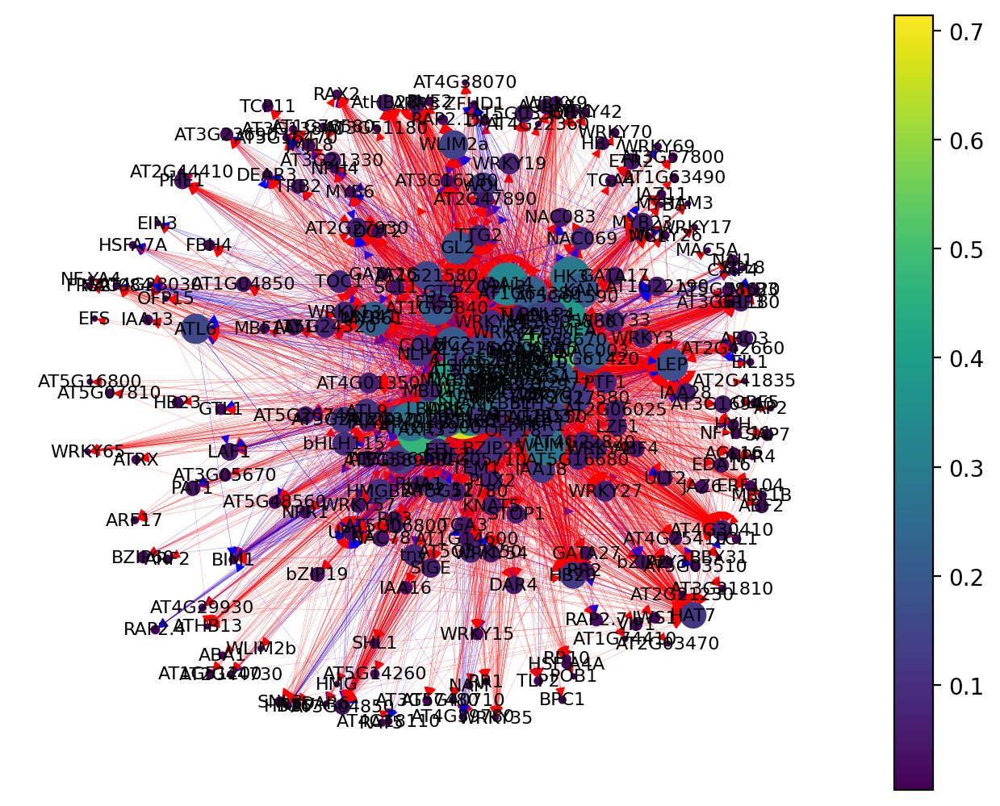

In [19]:
atri = network(0)

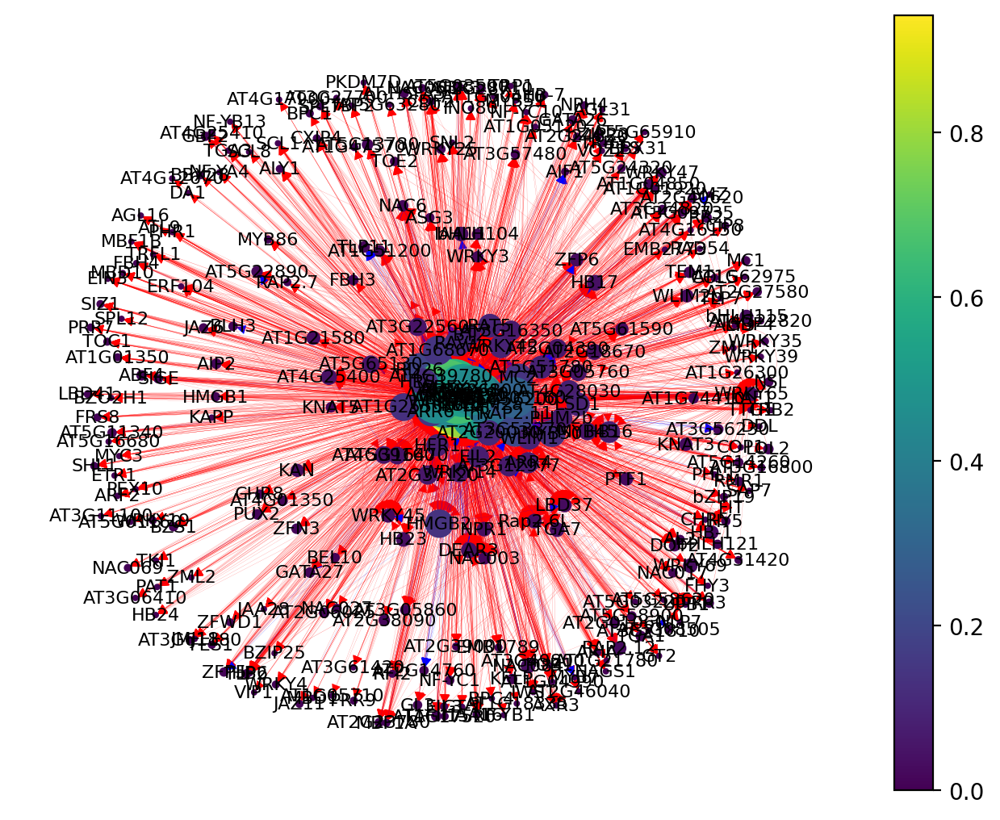

In [20]:
tri = network(1)

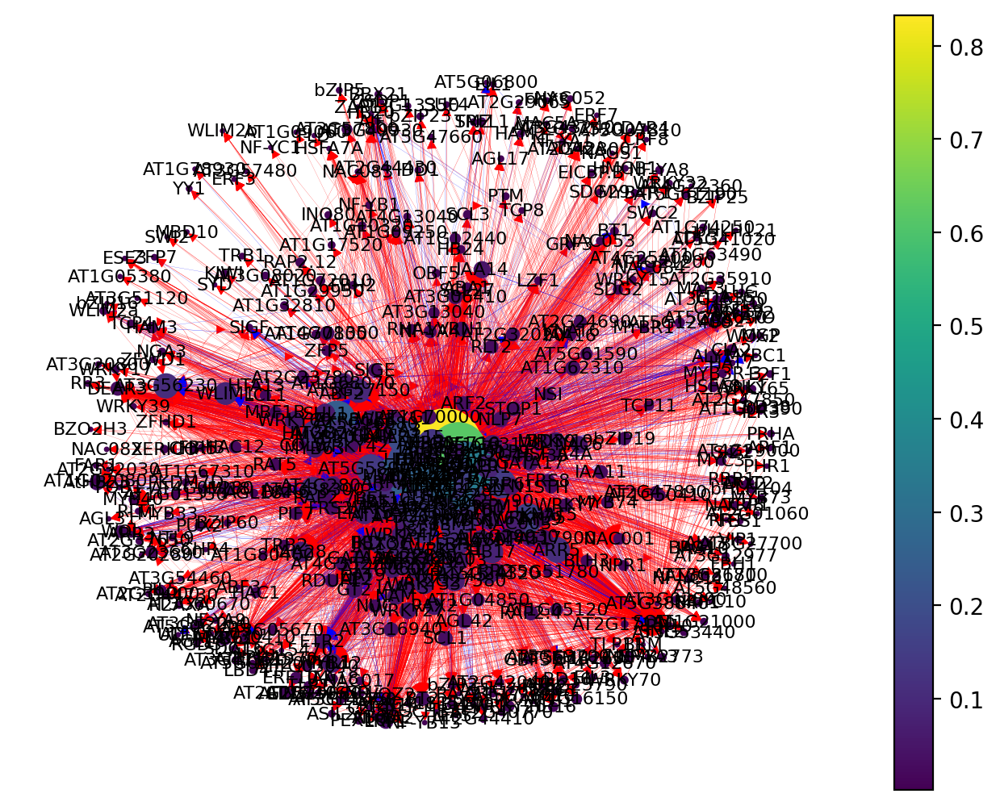

In [21]:
cor = network(2)

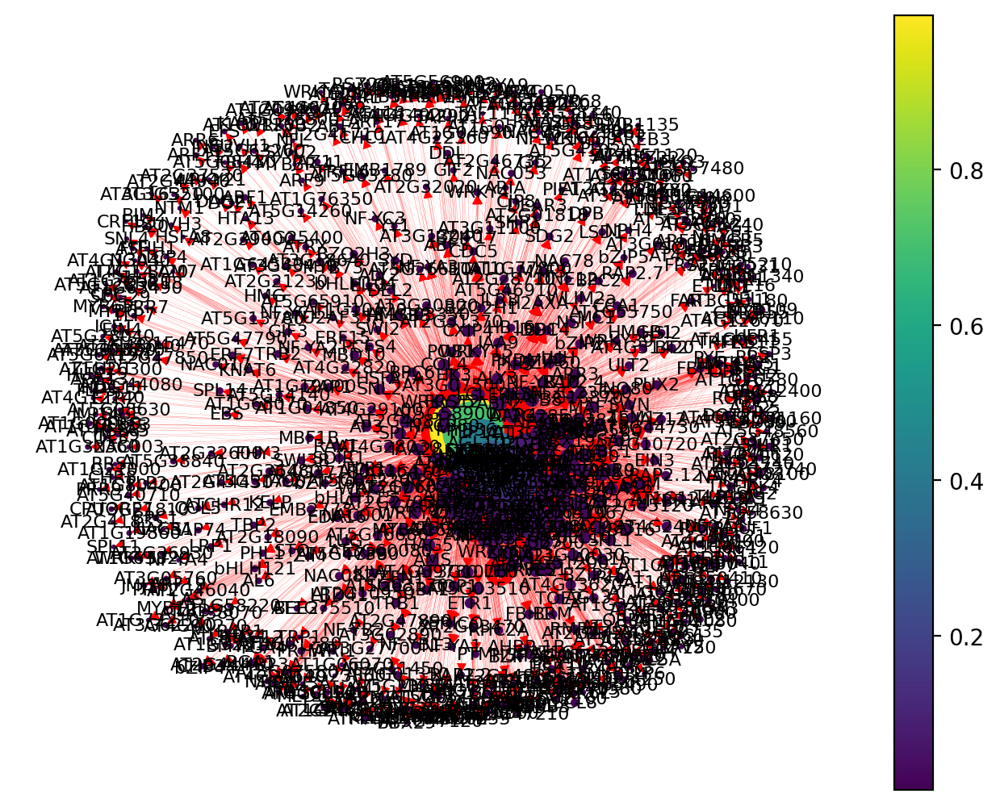

In [22]:
end = network(3)

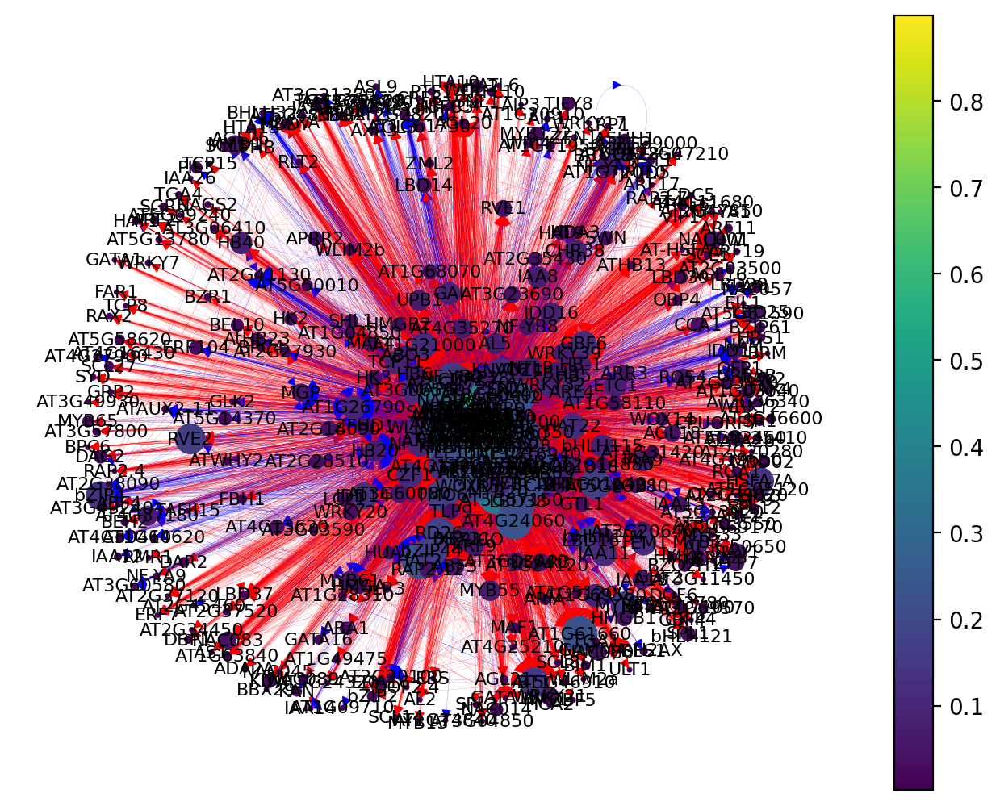

In [23]:
per = network(4)

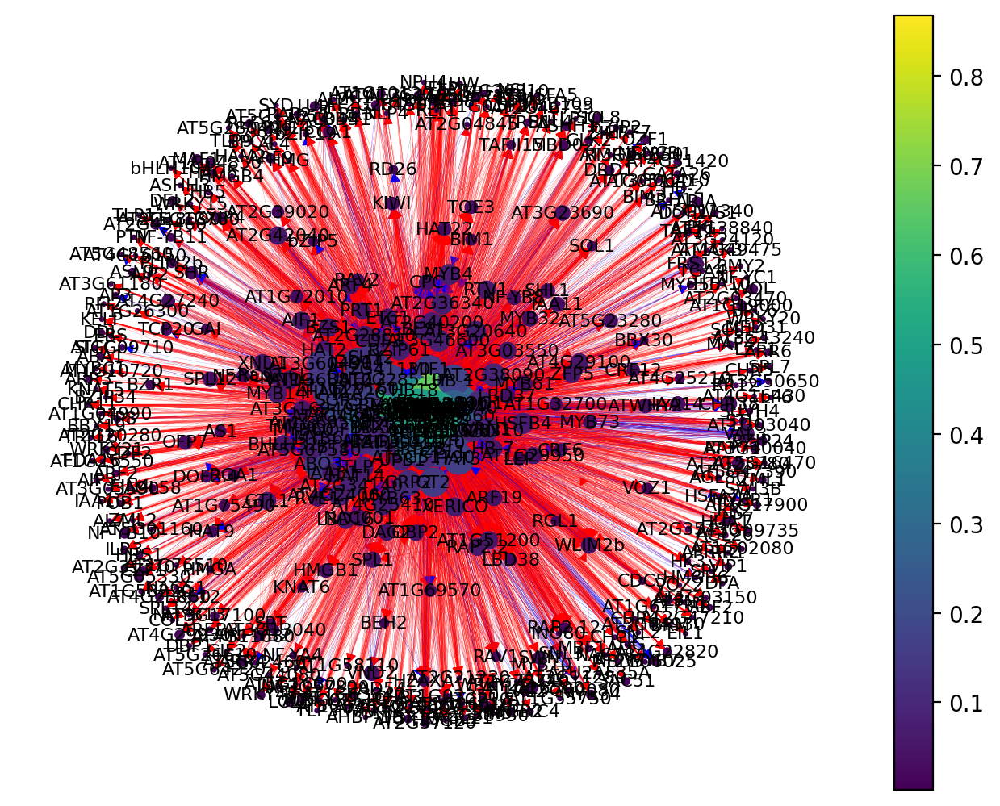

In [24]:
pro = network(5)

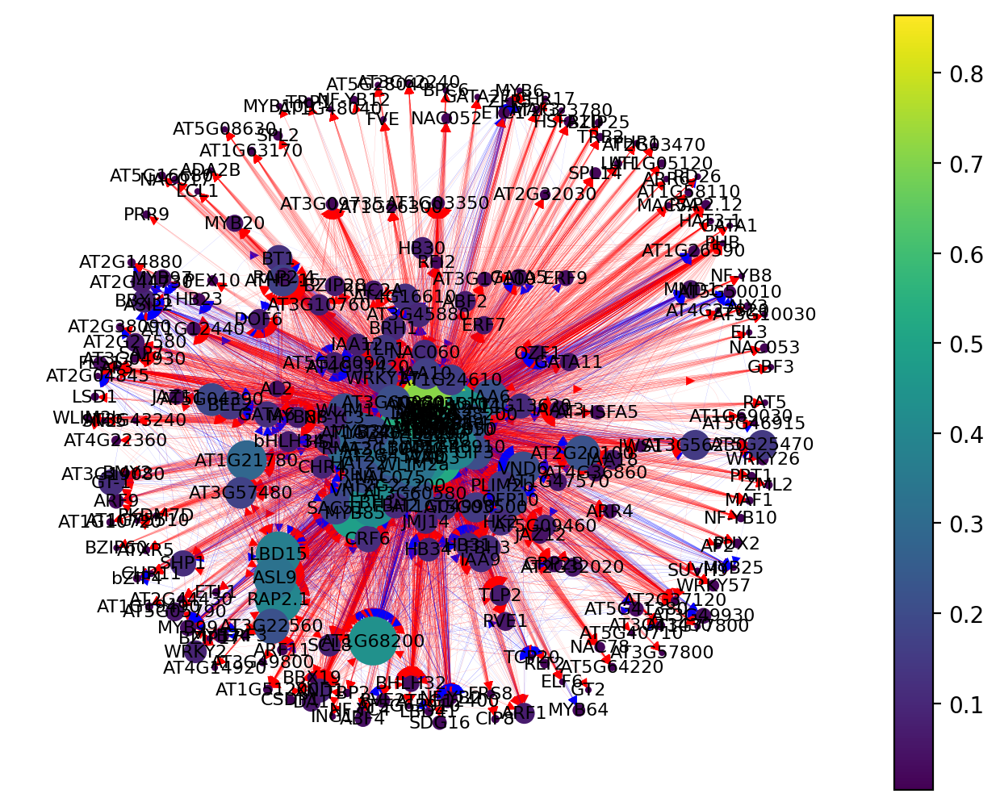

In [25]:
xyl = network(6)

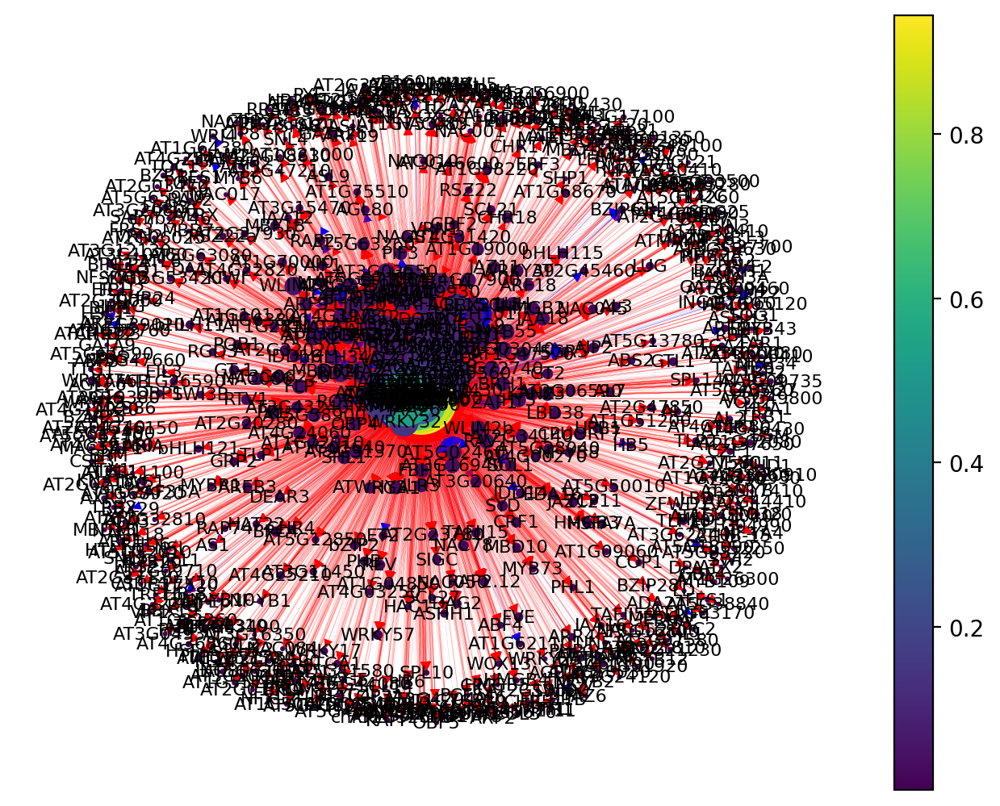

In [26]:
phl = network(7)

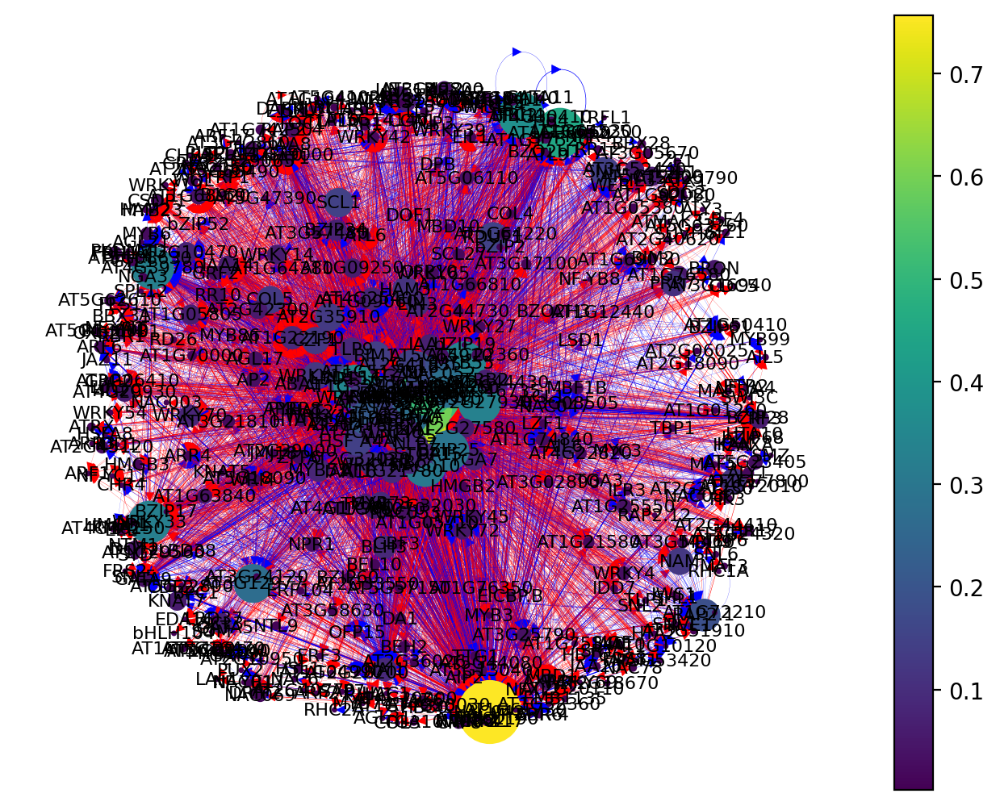

In [27]:
lrc = network(8)

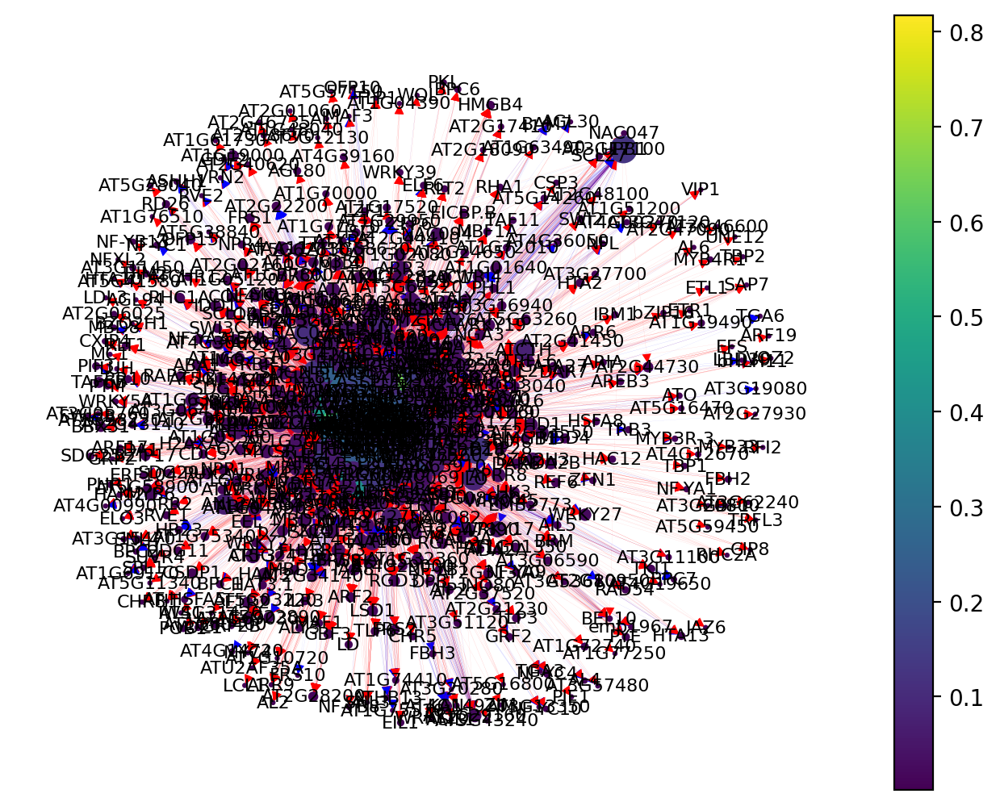

In [28]:
col = network(9)

In [29]:
atri.columns = ['atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality']
tri.columns = ['tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality']
cor.columns = ['cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality']
end.columns = ['end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality']
per.columns = ['per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality']
pro.columns = ['pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality']
xyl.columns = ['xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality']
phl.columns = ['phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality']
lrc.columns = ['lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality']
col.columns = ['col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality']

In [54]:
## Indentify main regulators in each net work
tff = []
tff = tff + atri[atri['atri_betweenness_centrality']>0].index.tolist()
tff = tff + tri[tri['tri_betweenness_centrality']>0].index.tolist()
tff = tff + lrc[lrc['lrc_betweenness_centrality']>0].index.tolist()
tff = tff + cor[cor['cor_betweenness_centrality']>0].index.tolist()
tff = tff + end[end['end_betweenness_centrality']>0].index.tolist()
tff = tff + per[per['per_betweenness_centrality']>0].index.tolist()
tff = tff + pro[pro['pro_betweenness_centrality']>0].index.tolist()
tff = tff + xyl[xyl['xyl_betweenness_centrality']>0].index.tolist()
tff = tff + phl[phl['phl_betweenness_centrality']>0].index.tolist()
tff = tff + col[col['col_betweenness_centrality']>0].index.tolist()
tf_occurance = pd.DataFrame(pd.Series(tff).value_counts())
tf_occurance = tf_occurance.rename(columns={
    'count': 'tf_occurance'
})
tf_spec = pd.concat([tf_occurance, atri, tri, lrc, cor, end, per, pro, xyl, phl, col], axis=1)
tf_spec = tf_spec.fillna(0)

In [55]:
## Epidermis (atri, tri, lrc)
celltype1='atri'
celltype2='tri'
celltype3='lrc'
ts = tf_spec[tf_spec['tf_occurance']==3][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==9].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,lrc_betweenness_centrality,atri_out_centrality,tri_out_centrality,lrc_out_centrality,atri_in_centrality,tri_in_centrality,lrc_in_centrality,centrality_count,centrality_sum


In [56]:
## atri, tri
celltype1='atri'
celltype2='tri'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,atri_betweenness_centrality,tri_betweenness_centrality,atri_out_centrality,tri_out_centrality,atri_in_centrality,tri_in_centrality,centrality_count,centrality_sum
NAC6,0.979472,0.000935,0.449477,0.017065,0.477352,0.143345,6,8.067646
WRKY61,0.799347,0.074419,0.376307,0.515358,0.118467,0.156997,6,8.040895
AT2G28710,0.792829,0.000561,0.418118,0.010239,0.313589,0.061433,6,7.596770


In [57]:
## Atrichoblast specific
celltype = 'atri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,atri_betweenness_centrality,atri_out_centrality,atri_in_centrality,centrality_count,centrality_sum
GL2,0.972686,0.191638,0.142857,3,4.307181
MYB23,0.911381,0.062718,0.313589,3,4.287688
TTG2,0.908019,0.073171,0.198606,3,4.179796
AT1G14600,0.901087,0.034843,0.261324,3,4.197254
MC2,0.865963,0.198606,0.209059,3,4.273629
AT3G05860,0.711752,0.386760,0.456446,3,4.554957
bZIP2,0.555201,0.031359,0.066202,3,3.652762
AT5G22890,0.429875,0.271777,0.209059,3,3.910711
WRKY13,0.426573,0.076655,0.327526,3,3.830755
AT3G04850,0.220999,0.038328,0.257840,3,3.517166


In [58]:
## Trichoblast specific
celltype = 'tri'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,tri_betweenness_centrality,tri_out_centrality,tri_in_centrality,centrality_count,centrality_sum
LRL3,0.979160,0.941980,0.802048,3,5.723187
AT4G09100,0.978470,0.655290,0.341297,3,4.975057
RSL2,0.963100,0.795222,0.245734,3,5.004056
RSL4,0.912619,0.610922,0.064846,3,4.588387
AT5G56200,0.865772,0.238908,0.102389,3,4.207069
AT3G53370,0.840631,0.211604,0.081911,3,4.134146
RHD6,0.816518,0.679181,0.153584,3,4.649282
IAA31,0.803672,0.351536,0.064846,3,4.220055
RAP2.11,0.699320,0.238908,0.105802,3,4.044030
AT5G06800,0.133737,0.447099,0.037543,3,3.618379


In [59]:
## LRC specific
celltype = 'lrc'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,lrc_betweenness_centrality,lrc_out_centrality,lrc_in_centrality,centrality_count,centrality_sum
GATA2,0.983314,0.092105,0.655702,3,4.731121
OFP6,0.931213,0.214912,0.149123,3,4.295248
BRON,0.791170,0.050439,0.050439,3,3.892047
BNQ3,0.737531,0.160088,0.116228,3,4.013847
AT1G05805,0.616806,0.063596,0.089912,3,3.770315
AT1G68920,0.610762,0.039474,0.140351,3,3.790587
BZIP34,0.587666,0.072368,0.063596,3,3.723631
PYE,0.587459,0.024123,0.081140,3,3.692722
AT1G74840,0.410044,0.024123,0.105263,3,3.539430
ATS,0.372373,0.017544,0.135965,3,3.525882


In [60]:
## Columella specific
celltype = 'col'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,col_betweenness_centrality,col_out_centrality,col_in_centrality,centrality_count,centrality_sum
NTT,0.921259,0.120209,0.165505,3,4.206974
IAA20,0.861707,0.439024,0.681185,3,4.981916
SCL1,0.831716,0.181185,0.048780,3,4.061681
ASL1,0.730363,0.198606,0.043554,3,3.972524
AT3G25790,0.633806,0.099303,0.060976,3,3.794085
AT2G20110,0.511119,0.033101,0.041812,3,3.586032
BPC7,0.472889,0.003484,0.024390,3,3.500763
SPT,0.178202,0.022648,0.036585,3,3.237435
AIL5,0.149561,0.006969,0.060976,3,3.217506
CHR17,0.121367,0.047038,0.045296,3,3.213702


In [61]:
## Ground tissue
celltype1='cor'
celltype2='end'
ts = tf_spec[tf_spec['tf_occurance']==2][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==6].sort_values(['centrality_count','centrality_sum'], ascending=False)

,cor_betweenness_centrality,end_betweenness_centrality,cor_out_centrality,end_out_centrality,cor_in_centrality,end_in_centrality,centrality_count,centrality_sum
AT1G05710,0.837503,0.002241,0.832627,0.210526,0.209746,0.159148,6,8.251791
AT1G72210,0.785702,0.017866,0.358051,0.001253,0.241525,0.015038,6,7.419435
JAZ6,0.449238,0.000308,0.459746,0.001253,0.239407,0.028822,6,7.178774
MYB12,0.639291,0.000925,0.061441,0.001253,0.110169,0.045113,6,6.858191
AT5G57150,0.037672,0.011064,0.093220,0.110276,0.273305,0.111529,6,6.637067
MYB122,0.000216,0.001134,0.207627,0.208020,0.086864,0.114035,6,6.617896
IDD4,0.010796,0.000013,0.317797,0.036341,0.120763,0.038847,6,6.524556
LRP1,0.000045,0.000135,0.033898,0.003759,0.260593,0.016291,6,6.314722
PTF1,0.015874,0.001233,0.141949,0.001253,0.125000,0.028822,6,6.314131
ERF15,0.069380,0.000002,0.072034,0.005013,0.033898,0.026316,6,6.206642


In [62]:
## Cortex specific
celltype = 'cor'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,cor_betweenness_centrality,cor_out_centrality,cor_in_centrality,centrality_count,centrality_sum
AT2G38300,0.896209,0.103814,0.188559,3,4.188582
RGL3,0.630618,0.063559,0.078390,3,3.772567
SIGF,0.616944,0.006356,0.055085,3,3.678384
HMG,0.431457,0.004237,0.042373,3,3.478067
WRKY69,0.230087,0.052966,0.120763,3,3.403815
LBD39,0.060154,0.025424,0.031780,3,3.117358
IDD7,0.043228,0.273305,0.122881,3,3.439414
HSFB3,0.035086,0.103814,0.014831,3,3.153730
TGA3,0.015181,0.101695,0.019068,3,3.135944
MYB14,0.011583,0.023305,0.042373,3,3.077261


In [63]:
## Endodermis specific
celltype = 'end'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,end_betweenness_centrality,end_out_centrality,end_in_centrality,centrality_count,centrality_sum
MYB36,0.422861,0.998747,1.001253,3,5.422861
MYB74,0.403892,0.250627,0.718045,3,4.372564
bZIP58,0.145439,0.283208,0.091479,3,3.520126
chr31,0.136345,0.309524,0.151629,3,3.597498
HDG11,0.076425,0.002506,0.001253,3,3.080185
...,...,...,...,...,...
AT5G47790,0.000002,0.003759,0.005013,3,3.008774
TRB1,0.000002,0.010025,0.006266,3,3.016292
AT3G18870,0.000002,0.017544,0.018797,3,3.036342
NSI,0.000002,0.010025,0.006266,3,3.016292


In [64]:
## Stele
celltype1='per'
celltype2='pro'
celltype3='xyl'
celltype4='phl'
ts = tf_spec[tf_spec['tf_occurance']==4][[celltype1+'_betweenness_centrality', celltype2+'_betweenness_centrality', celltype3+'_betweenness_centrality', celltype4+'_betweenness_centrality', celltype1+'_out_centrality', celltype2+'_out_centrality', celltype3+'_out_centrality', celltype4+'_out_centrality', celltype1+'_in_centrality', celltype2+'_in_centrality', celltype3+'_in_centrality', celltype4+'_in_centrality']]
tso = (ts > 0)
ts['centrality_count'] = tso.sum(axis=1)
ts['centrality_sum'] = ts.sum(axis=1)
ts[ts['centrality_count']==12].sort_values(['centrality_count','centrality_sum'], ascending=False)

,per_betweenness_centrality,pro_betweenness_centrality,xyl_betweenness_centrality,phl_betweenness_centrality,per_out_centrality,pro_out_centrality,xyl_out_centrality,phl_out_centrality,per_in_centrality,pro_in_centrality,xyl_in_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G43430,0.983399,0.991083,0.002998,0.941993,0.719626,0.264642,0.011029,0.113069,0.306075,0.290672,0.125000,0.095448,12,16.845034
MYB88,0.178522,0.365675,0.001343,0.096081,0.142523,0.752711,0.069853,0.258443,0.060748,0.867679,0.279412,0.152717,12,15.225707


In [65]:
## Pericycle
celltype = 'per'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,per_betweenness_centrality,per_out_centrality,per_in_centrality,centrality_count,centrality_sum
AT1G26790,0.966961,0.093458,0.341121,3,4.401541
IDD11,0.925491,0.037383,0.177570,3,4.140444
bZIP4,0.925141,0.137850,0.137850,3,4.200842
ICE1,0.895768,0.556075,0.114486,3,4.566329
ATL5,0.892162,0.261682,0.137850,3,4.291695
HB-2,0.864924,0.023364,0.074766,3,3.963055
LBD38,0.843228,0.210280,0.084112,3,4.137621
AT1G47570,0.813161,0.130841,0.067757,3,4.011759
LBD14,0.758645,0.032710,0.044393,3,3.835748
HB21,0.311749,0.581776,0.233645,3,4.127170


In [66]:
## Procambium
celltype = 'pro'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,pro_betweenness_centrality,pro_out_centrality,pro_in_centrality,centrality_count,centrality_sum
HB18,0.961256,0.184382,0.130152,3,4.275790
HAT3,0.937320,0.169197,0.125813,3,4.232330
VAL3,0.936876,0.049892,0.086768,3,4.073536
SHR,0.631835,0.023861,0.062907,3,3.718603
DOF1,0.576714,0.112798,0.049892,3,3.739404
HAT14,0.510153,0.084599,0.032538,3,3.627289
ETC1,0.193922,0.052061,0.052061,3,3.298043
REV,0.176398,0.418655,0.073753,3,3.668806
AT2G38090,0.106692,0.088937,0.019523,3,3.215151
CHR38,0.103409,0.039046,0.065076,3,3.207531


In [67]:
## Xylem
celltype = 'xyl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,xyl_betweenness_centrality,xyl_out_centrality,xyl_in_centrality,centrality_count,centrality_sum
VND6,0.991562,0.205882,0.352941,3,4.550385
MYB83,0.984331,0.786765,0.305147,3,5.076243
OFP10,0.975920,0.183824,0.312500,3,4.472243
AT3G60580,0.968825,0.224265,0.360294,3,4.553383
AT1G68200,0.964388,0.433824,0.268382,3,4.666594
AT1G66810,0.959586,0.790441,0.341912,3,5.091939
ZHD3,0.953223,0.757353,0.253676,3,4.964253
HB31,0.937581,0.106618,0.198529,3,4.242728
BEE2,0.904018,0.143382,0.187500,3,4.234901
MYB52,0.897371,0.665441,0.213235,3,4.776047


In [68]:
## Phloem
celltype = 'phl'
cs = tf_spec[tf_spec['tf_occurance']==1][[celltype+'_betweenness_centrality', celltype+'_out_centrality',celltype+'_in_centrality']]
cso = (cs > 0)
cs['centrality_count'] = cso.sum(axis=1)
cs['centrality_sum'] = cs.sum(axis=1)
cs[cs['centrality_count']==3].sort_values(['centrality_count',celltype+'_betweenness_centrality'], ascending=False)

,phl_betweenness_centrality,phl_out_centrality,phl_in_centrality,centrality_count,centrality_sum
AT3G12730,0.971001,0.870778,0.113069,3,4.954848
AT2G03500,0.951661,0.679883,0.146843,3,4.778386
GATA20,0.947724,0.071953,0.058737,3,4.078414
bHLH11,0.934720,0.008811,0.017621,3,3.961151
NAC057,0.916356,0.502203,0.142438,3,4.560996
DOF2.4,0.905453,0.089574,0.054332,3,4.049359
MBF1A,0.885024,0.060206,0.102790,3,4.048020
BHLH101,0.790265,0.041116,0.232012,3,4.063393
REM22,0.451963,0.001468,0.024963,3,3.478395
AGL15,0.291155,0.089574,0.246696,3,3.627425


## Search for individual genes

In [69]:
gene = 'SHR'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,per_degree_centrality,per_out_centrality,per_in_centrality,per_closeness_centrality,per_eigenvector_centrality,pro_degree_centrality,pro_out_centrality,pro_in_centrality,pro_betweenness_centrality,pro_closeness_centrality,pro_eigenvector_centrality
SHR,1.0,0.060748,0.037383,0.023364,0.000513,0.019181,0.086768,0.023861,0.062907,0.631835,0.000413,0.038122


In [70]:
gene = 'BLJ'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BLJ,1.0,0.322055,0.135338,0.186717,0.001074,0.000399,0.113638


In [71]:
gene = 'JKD'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,cor_degree_centrality,cor_out_centrality,cor_in_centrality,cor_closeness_centrality,cor_eigenvector_centrality,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
JKD,1.0,0.258475,0.038136,0.220339,0.000534,0.088457,0.196742,0.072682,0.12406,0.006877,0.000378,0.089774


In [72]:
gene = 'RVN'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
RVN,1.0,0.16792,0.12782,0.0401,0.000039,0.000293,0.086271


In [73]:
gene = 'BIB'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,end_degree_centrality,end_out_centrality,end_in_centrality,end_betweenness_centrality,end_closeness_centrality,end_eigenvector_centrality
BIB,1.0,0.097744,0.051378,0.046366,0.000016,0.000321,0.061238


In [74]:
gene = 'IME'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [75]:
gene = 'MYB66'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

""


In [76]:
gene = 'GL2'
tf_spec[tf_spec.index==gene][tf_spec[tf_spec.index==gene].columns[tf_spec[tf_spec.index==gene].any()]]

,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality
GL2,1.0,0.334495,0.191638,0.142857,0.972686,0.000502,0.077748


In [77]:
tf_spec.to_csv('TF_GRN_centrality_t7-t9_zscore3.csv', index=True)